In [1]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
#%matplotlib notebook
import gui
import registration_gui as rgui
from skimage.segmentation import mark_boundaries
from skimage.transform import downscale_local_mean, rotate
import numpy as np
import os
import tifffile
OUTPUT_DIR = "output"
from scipy import ndimage

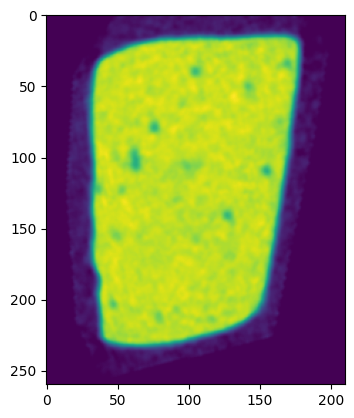

In [2]:
low_res = tifffile.imread('data2/low_res_Substack (125-192).tif')
upsampled = ndimage.zoom(low_res,2.0)

rotated = np.zeros((upsampled.shape[0],500,500))
for i in range (upsampled.shape[0]):
    rotated_2d = rotate(upsampled[i], angle=-120, resize=True, center=None,
                     order=None, mode='constant', cval=0, clip=False, preserve_range=True)
    rotated[i,:rotated_2d.shape[0],:rotated_2d.shape[1]] = rotated_2d

rotated = rotated[:,60:320,70:280]
tifffile.imwrite('data2/low_res_preprocessed.tif', rotated.astype('uint8') )
plt.imshow(rotated[50])

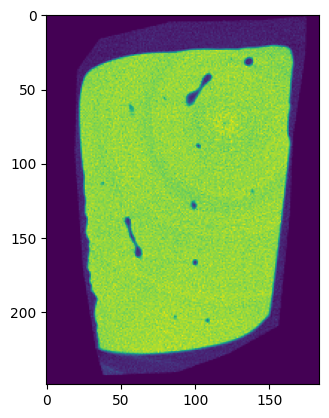

In [3]:
#preparing the high-res image for 60 micro meter

high_res = tifffile.imread('data2/high_res_Substack (133-790).tif')
down_scaled = downscale_local_mean(high_res, (5,5,5))

down_scaled = (down_scaled/100).astype('uint8')
plt.imshow(down_scaled[20])
tifffile.imwrite('data2/high_res_preprocessed.tif', down_scaled )

In [4]:

#fixed_image = sitk.ReadImage(path9, sitk.sitkFloat32)
fixed_image = sitk.ReadImage('data2/low_res_preprocessed.tif', sitk.sitkFloat32)
print ('moving_image shape', fixed_image.GetSize())

moving_image = sitk.ReadImage('data2/high_res_preprocessed.tif', sitk.sitkFloat32)
print ('fixed_image shape', moving_image.GetSize())

#masks = sitk.ReadImage('data/preprocessed/mask.tif', sitk.sitkFloat32)
#print ('masks shape', masks.GetSize())

moving_image shape (210, 260, 136)
fixed_image shape (184, 249, 132)


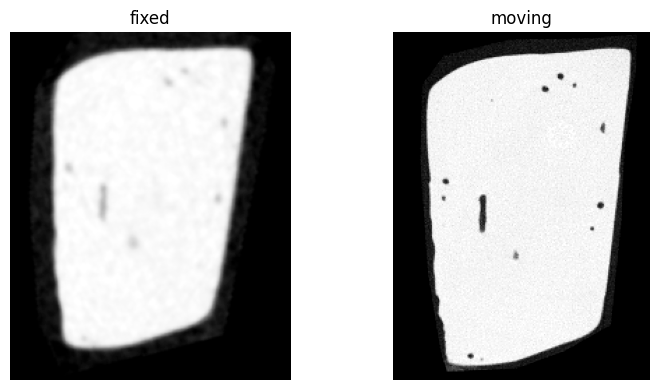

In [5]:
#fixed_image = sitk.ReadImage(fdata("training_001_ct.mha"), sitk.sitkFloat32)
#moving_image = sitk.ReadImage(fdata("training_001_mr_T1.mha"), sitk.sitkFloat32)

ct_window_level = [835, 162]
mr_window_level = [1036, 520]

gui.MultiImageDisplay(
    image_list=[fixed_image, moving_image],
    title_list=["fixed", "moving"],
    figure_size=(8, 4),
    window_level_list=[ct_window_level, mr_window_level],
);

In [6]:
initial_transform = sitk.CenteredTransformInitializer(
    fixed_image,
    moving_image,
    sitk.Euler3DTransform(),
    sitk.CenteredTransformInitializerFilter.GEOMETRY,
)

'''gui.RegistrationPointDataAquisition(
    fixed_image,
    moving_image,
    figure_size=(8, 4),
    known_transformation=initial_transform,
    fixed_window_level=ct_window_level,
    moving_window_level=mr_window_level,
);'''

'gui.RegistrationPointDataAquisition(\n    fixed_image,\n    moving_image,\n    figure_size=(8, 4),\n    known_transformation=initial_transform,\n    fixed_window_level=ct_window_level,\n    moving_window_level=mr_window_level,\n);'

In [7]:

def command_iteration(method):
    print(
        f"{method.GetOptimizerIteration():3} "
        + f"= {method.GetMetricValue():10.5f}"
    )



In [8]:
registration_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
#registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=200)
registration_method.SetMetricAsANTSNeighborhoodCorrelation(4)
#registration_method.SetMetricAsMeanSquares()
#registration_method.SetMetricAsCorrelation()

#registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
#registration_method.SetMetricSamplingPercentage(0.8)

registration_method.SetInterpolator(sitk.sitkLinear)

# Optimizer settings.
registration_method.SetOptimizerAsGradientDescent(
    learningRate=0.1,
    numberOfIterations=30,
    convergenceMinimumValue=1e-6,
    convergenceWindowSize=100,
)
registration_method.SetOptimizerScalesFromPhysicalShift()
#registration_method.SetOptimizerScalesFromIndexShift()
#registration_method.SetOptimizerScalesFromJacobian()

# Setup for the multi-resolution framework.
# registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
# registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2,1,0])
# registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Don't optimize in-place, we would possibly like to run this cell multiple times.
registration_method.SetInitialTransform(initial_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
#registration_method.AddCommand(sitk.sitkStartEvent, rgui.start_plot)
#registration_method.AddCommand(sitk.sitkEndEvent, rgui.end_plot)
#registration_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, rgui.update_multires_iterations)
#registration_method.AddCommand(sitk.sitkIterationEvent, lambda: rgui.plot_values(registration_method))
registration_method.AddCommand(sitk.sitkIterationEvent, lambda: command_iteration(registration_method))
print(f" Iteration: {registration_method.GetOptimizerIteration()}")

final_transform = registration_method.Execute(fixed_image, moving_image)

# Always check the reason optimization terminated.

print(f" Metric value: {registration_method.GetMetricValue()}")
print("Final metric value: {0}".format(registration_method.GetMetricValue()))
print(
    "Optimizer's stopping condition, {0}".format(
        registration_method.GetOptimizerStopConditionDescription()
    )
)

 Iteration: 3803052144
  0 =   -0.30605
  1 =   -0.31032
  2 =   -0.31599
  3 =   -0.32712
  4 =   -0.33353
  5 =   -0.33683
  6 =   -0.33991
  7 =   -0.34519
  8 =   -0.34707
  9 =   -0.34894
 10 =   -0.36198
 11 =   -0.36916
 12 =   -0.36943
 13 =   -0.38158
 14 =   -0.38540
 15 =   -0.38710
 16 =   -0.37639
 17 =   -0.38512
 18 =   -0.39018
 19 =   -0.39298
 20 =   -0.39553
 21 =   -0.39761
 22 =   -0.39943
 23 =   -0.40030
 24 =   -0.40158
 25 =   -0.40216
 26 =   -0.40274
 27 =   -0.40202
 28 =   -0.40435
 29 =   -0.40448
 Metric value: -0.4044758653449733
Final metric value: -0.4044758653449733
Optimizer's stopping condition, GradientDescentOptimizerv4Template: Maximum number of iterations (30) exceeded.


In [9]:
"""gui.RegistrationPointDataAquisition(
    fixed_image,
    moving_image,
    figure_size=(8, 4),
    known_transformation=final_transform,
    fixed_window_level=ct_window_level,
    moving_window_level=mr_window_level,
);"""

'gui.RegistrationPointDataAquisition(\n    fixed_image,\n    moving_image,\n    figure_size=(8, 4),\n    known_transformation=final_transform,\n    fixed_window_level=ct_window_level,\n    moving_window_level=mr_window_level,\n);'

(array([3.750635e+06, 9.979900e+04, 3.543500e+04, 3.563200e+04,
        4.783000e+04, 5.418900e+04, 1.465049e+06, 1.936717e+06,
        3.110000e+02, 3.000000e+00]),
 array([ 0.        ,  8.91457272, 17.82914543, 26.7437191 , 35.65829086,
        44.57286453, 53.4874382 , 62.40201187, 71.31658173, 80.2311554 ,
        89.14572906]),
 <BarContainer object of 10 artists>)

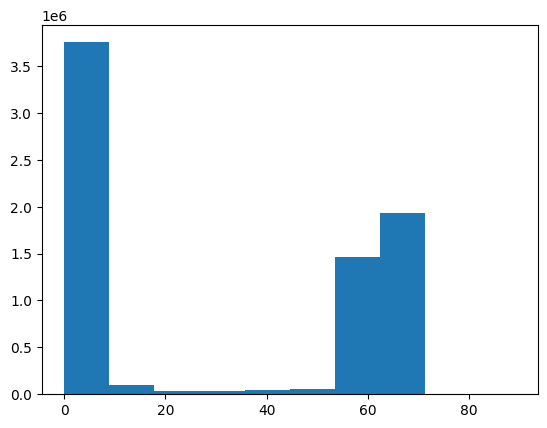

In [10]:
transformed_image = sitk.Resample(moving_image,fixed_image,final_transform,sitk.sitkLinear,0.0,moving_image.GetPixelID(),)
mask_ = sitk.GetArrayViewFromImage(transformed_image)
plt.hist(mask_.ravel())

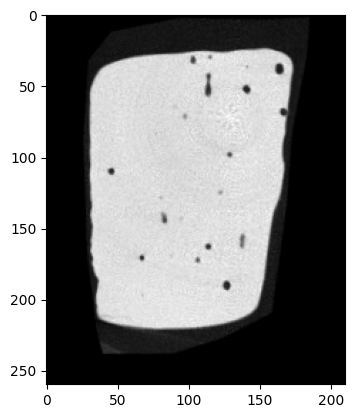

In [11]:
plt.imshow(mask_[5],'gray')

In [12]:

mask = np.zeros_like(mask_,dtype='uint8')
mask[mask_>=50] = 1
mask[mask_<50] = 0
original_image = sitk.GetArrayViewFromImage(fixed_image).astype('uint8')

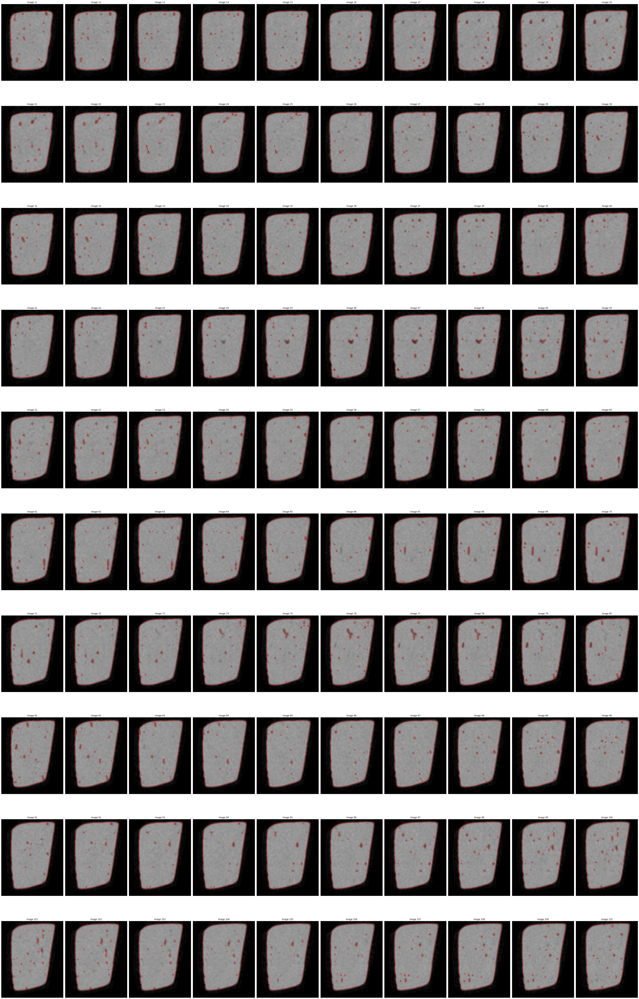

In [16]:
# Create a figure with subplots for displaying multiple images
fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(50, 80))

# Flatten the axes array to iterate over subplots
axes = axes.flatten()

for i, ax in enumerate(axes[:]):
    i = i+10
    overlay = mark_boundaries(original_image[i], mask[i], color=(1, 0, 0))  # Overlay boundaries on the image
    ax.imshow(overlay)
    ax.axis('off')  # Turn off axis labels
    ax.set_title(f"Image {i+1}")
    
fig.subplots_adjust(wspace=0.1, hspace=0.3)
plt.tight_layout()  # Adjust layout
plt.savefig('figs_6.pdf')
plt.show()

In [17]:
def padd_to_proper(data):
    padded_image = np.pad(data[5:-3,:-4,41:-41], ((0,0), (0,0), (0, 0)), mode='constant') 
    print ('shape of paded is ', padded_image.shape)
    return padded_image[:,:,:]

In [18]:
low_res_corresponding_array = sitk.GetArrayViewFromImage(fixed_image)

In [19]:
print ('shape of input image = ', low_res_corresponding_array.shape)
print ('shape of mask = ', mask.shape)


shape of input image =  (136, 260, 210)
shape of mask =  (136, 260, 210)


In [20]:
#saving the images
tifffile.imwrite('output/registered_mask.tif', padd_to_proper(mask))
tifffile.imwrite('output/fixed_low_res.tif',padd_to_proper(low_res_corresponding_array))

shape of paded is  (128, 256, 128)
shape of paded is  (128, 256, 128)
